To perform binary classification in which the model predicts whether a given image is a plant or not.


*   If the image is not a plant, it is ignored in the front end.
*   If the image is a plant, then another model works on it to identify what disease the plant is infested with.

### Image Loading

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from sklearn.datasets import fetch_openml
import matplotlib as mpl
import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive/', force_remount=True)

In [ ]:
# Load plant images
path = "/content/drive/MyDrive/Dataset/dataset750/"
plant_images = []

for i in range(1, 751):
  img = cv2.imread(path + "plant/plant ({0}).JPG".format(i))
  img = cv2.resize(img, (256, 256)) # Resize to the same size
  img = img.astype('float32')
  img /= 255.0      # Normalizing values to lie in the range: [0, 1]
  plant_images.append(img)

# Load non-plant images
non_plant_images = []
for i in range(1, 701):
  img = cv2.imread(path + "non_plant/not_leaf ({0}).jpg".format(i))
  img = cv2.resize(img, (256, 256)) # Resize to the same size
  img = img.astype('float32')
  img /= 255.0
  non_plant_images.append(img)

In [ ]:
X = plant_images + non_plant_images
X = np.array(X)

In [ ]:
y_plant = [1] * len(plant_images)
y_non_plant = [0] * len(non_plant_images)
y = y_plant + y_non_plant
y = np.array(y)
y = y.astype(np.uint8)

In [ ]:
len(y), len(X)

(1450, 1450)

Dataset information

1. Plant dataset size = 750
2. Non-Plant dataset size = 700

Total dataset = 750 + 700 = 1450

1. Training set size = 1100 (approx)
2. Test set size = 150
3. Val set size = 200

### Neural Network: ANN without Image Augmentation

Parameters of the neural network: ann2_16
1. 2 layers - 32 + 64 neurons
2. Batch Size - 16

In [ ]:
import cv2
import numpy as np
from sklearn import svm
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import array_to_img, img_to_array, load_img
from keras.callbacks import ModelCheckpoint

import os
import shutil

In [ ]:
# Define the image size
img_width, img_height = 256, 256
input_shape = (img_width, img_height, 3)

# Define the batch size for training
batch_size = 16

Splitting the dataset: Training, Test and Validation set

In [ ]:
from sklearn.model_selection import train_test_split

# split test from total - train + test
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.103, random_state=42)

# split val from train
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.1538, random_state=42)

Dimensions of Training, Test and Val dataset

In [ ]:
x_train.shape, x_test.shape, x_val.shape

((1100, 256, 256, 3), (150, 256, 256, 3), (200, 256, 256, 3))

Setting the seed value: to produce reproducible results

In [ ]:
import tensorflow as tf

seed_value = 42
np.random.seed(seed_value)

# Set the seed for TensorFlow
tf.random.set_seed(seed_value)

In [ ]:
model = keras.models.Sequential()
model.add(keras.layers.Flatten(input_shape=input_shape))
model.add(keras.layers.Dense(32, activation="selu"))
model.add(keras.layers.Dense(64, activation="selu"))
model.add(keras.layers.Dense(1, activation="sigmoid"))

In [ ]:
import tensorflow as tf

model.compile(loss="binary_crossentropy",
              optimizer=tf.keras.optimizers.AdamW(),
              metrics=["accuracy"])

In [ ]:
# save the weights and the model in directory
save_dir = "/content/drive/MyDrive/Dataset/leaves_SVM/"

checkpoint = ModelCheckpoint(save_dir + 'ann2_16.h5',
                             save_best_only = True,
                             verbose = 1)

early_stopping = keras.callbacks.EarlyStopping(patience=5,
                                               restore_best_weights=True)

Tensorboard callback: saving the logs for visualization

In [ ]:
from keras.callbacks import TensorBoard

# Create a TensorBoard callback
log_dir = save_dir + "/my_logs/fit/ann2_16"
tensorboard_callback = TensorBoard(log_dir=log_dir)

In [ ]:
epochs = 1000

history = model.fit(x_train, y_train,
                    epochs=epochs,
                    validation_data=(x_val, y_val),
                    batch_size = batch_size,
                    callbacks=[checkpoint, early_stopping, tensorboard_callback])

Epoch 1/1000
69/69 [==============================] - ETA: 0s - loss: 2.9559 - accuracy: 0.6955
Epoch 1: val_loss improved from inf to 0.99469, saving model to /content/drive/MyDrive/Dataset/leaves_SVM/ann2_16.h5
69/69 [==============================] - 9s 112ms/step - loss: 2.9559 - accuracy: 0.6955 - val_loss: 0.9947 - val_accuracy: 0.6500
Epoch 2/1000
69/69 [==============================] - ETA: 0s - loss: 0.8074 - accuracy: 0.7855
Epoch 2: val_loss improved from 0.99469 to 0.37733, saving model to /content/drive/MyDrive/Dataset/leaves_SVM/ann2_16.h5
69/69 [==============================] - 7s 108ms/step - loss: 0.8074 - accuracy: 0.7855 - val_loss: 0.3773 - val_accuracy: 0.8450
Epoch 3/1000
69/69 [==============================] - ETA: 0s - loss: 0.4020 - accuracy: 0.8609
Epoch 3: val_loss did not improve from 0.37733
69/69 [==============================] - 6s 94ms/step - loss: 0.4020 - accuracy: 0.8609 - val_loss: 0.5807 - val_accuracy: 0.7950
Epoch 4/1000
69/69 [===============

In [ ]:
# Roll back to the best model
model = keras.models.load_model(save_dir + 'ann2_16.h5')

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (None, 196608)            0         
                                                                 
 dense (Dense)               (None, 32)                6291488   
                                                                 
 dense_1 (Dense)             (None, 64)                2112      
                                                                 
 dense_2 (Dense)             (None, 1)                 65        
                                                                 
Total params: 6,293,665
Trainable params: 6,293,665
Non-trainable params: 0
_________________________________________________________________


Model Evaluation

In [ ]:
accuracy_score = model.evaluate(x_test, y_test)

print("Accuracy: {:.4f}%".format(accuracy_score[1] * 100))
print("Loss: ",accuracy_score[0])

# 3 data splits
# 550 - training
# 100 - valid
# 100 - test

5/5 [==============================] - 0s 25ms/step - loss: 0.1072 - accuracy: 0.9600
Accuracy: 96.0000%
Loss:  0.1071542352437973


Confusion matrix (training dataset)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

y_train_pred = model.predict(x_train)
y_train_pred[:5]

35/35 [==============================] - 3s 72ms/step


array([[9.3979281e-01],
       [4.2520322e-02],
       [4.1862932e-05],
       [9.9745220e-01],
       [1.8937159e-03]], dtype=float32)

In [ ]:
y_train_pred = y_train_pred > 0.5
y_train_pred = y_train_pred.astype('int32')
y_train_pred[:5]

array([[1],
       [0],
       [0],
       [1],
       [0]], dtype=int32)

Seaborn Heatmap


<Axes: >

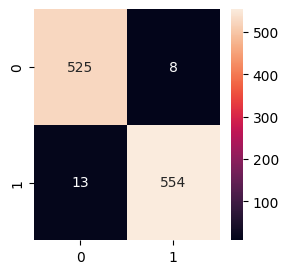

In [ ]:
cm = confusion_matrix(y_train, y_train_pred)
df = pd.DataFrame(cm, columns=[0,1])
plt.figure(figsize=(3,3))

print("Seaborn Heatmap")
sn.heatmap(df, annot=True, fmt='g')

Confusion matrix (test dataset)

In [ ]:
y_test_pred = model.predict(x_test) > 0.5
y_test_pred = y_test_pred.astype('int32')

5/5 [==============================] - 0s 25ms/step


Seaborn Heatmap (Test dataset)


<Axes: >

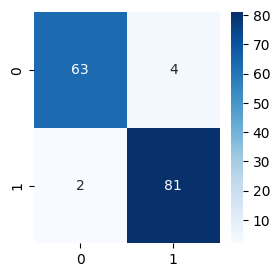

In [ ]:
cm = confusion_matrix(y_test, y_test_pred)
df = pd.DataFrame(cm, columns=[0,1])
plt.figure(figsize=(3,3))

print("Seaborn Heatmap (Test dataset)")
sn.heatmap(df, annot=True, fmt='g', cmap='Blues')

Classification Report

In [ ]:
from sklearn.metrics import classification_report

print('Classification Report: ')
print(classification_report(y_test, y_test_pred))

Classification Report: 
              precision    recall  f1-score   support

           0       0.97      0.94      0.95        67
           1       0.95      0.98      0.96        83

    accuracy                           0.96       150
   macro avg       0.96      0.96      0.96       150
weighted avg       0.96      0.96      0.96       150



Performance metrics (Training dataset)

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

print("On training dataset")
print("Precision score: ", precision_score(y_train, y_train_pred, zero_division=0))
print("Recall score: ", recall_score(y_train, y_train_pred, zero_division=0))
print("F1 score: ", f1_score(y_train, y_train_pred, zero_division=0))

On training dataset
Precision score:  0.9857651245551602
Recall score:  0.9770723104056437
F1 score:  0.9813994685562446


Performance metrics (Test dataset)

In [ ]:
print("On test dataset")
print("Precision score: ", precision_score(y_test, y_test_pred, zero_division=0))
print("Recall score: ", recall_score(y_test, y_test_pred, zero_division=0))
print("F1 score: ", f1_score(y_test, y_test_pred, zero_division=0))

On test dataset
Precision score:  0.9529411764705882
Recall score:  0.9759036144578314
F1 score:  0.9642857142857143


Making predictions on new data

In [ ]:
path_preds = "/content/drive/MyDrive/Dataset/leaves_SVM/preds2/"
pred_files = {
    # # with confusing images
    # # 6, 10, 11, 20
                'leaf_1.png':1, 'leaf_2.png':1, 'leaf_3.png':1, 'leaf_4.png':1, 'leaf_5.png':1, 'leaf_6.png':1, 'leaf_7.png':1,
                'leaf_8.png':1, 'leaf_9.png':1, 'leaf_10.png':1, 'leaf_11.png':1, 'leaf_12.png':1, 'leaf_13.png':1, 'leaf_14.png':1,
                'leaf_15.png':1, 'leaf_16.png':1, 'leaf_17.png':1, 'leaf_18.png':1, 'leaf_19.png':1, 'leaf_20.png':1, 'leaf_21.png':1,
                'leaf_22.png':1, 'leaf_23.png':1, 'leaf_24.png':1, 'leaf_25.png':1, 'leaf_26.png':1, 'leaf_27.png':1, 'leaf_28.png':1,
                'leaf_29.png':1, 'leaf_30.png':1,

    # 3, 9, 25, 44, 57, 70, 87, 89
                'not_leaf_1.png':0, 'not_leaf_2.png':0, 'not_leaf_3.png':0, 'not_leaf_4.png':0, 'not_leaf_5.png':0,
                'not_leaf_6.png':0, 'not_leaf_7.png':0, 'not_leaf_8.png':0, 'not_leaf_9.png':0, 'not_leaf_10.png':0,
                'not_leaf_11.png':0, 'not_leaf_12.png':0, 'not_leaf_13.png':0, 'not_leaf_14.png':0, 'not_leaf_15.png':0,
                'not_leaf_16.png':0, 'not_leaf_17.png':0, 'not_leaf_18.png':0, 'not_leaf_19.png':0, 'not_leaf_20.png':0,
                'not_leaf_21.png':0, 'not_leaf_22.png':0, 'not_leaf_23.png':0, 'not_leaf_24.png':0, 'not_leaf_25.png':0,
                'not_leaf_26.png':0, 'not_leaf_27.png':0, 'not_leaf_28.png':0, 'not_leaf_29.png':0, 'not_leaf_30.png':0,
                'not_leaf_31.png':0, 'not_leaf_32.png':0, 'not_leaf_33.png':0, 'not_leaf_34.png':0, 'not_leaf_35.png':0,
                'not_leaf_36.png':0, 'not_leaf_37.png':0, 'not_leaf_38.png':0, 'not_leaf_39.png':0, 'not_leaf_40.png':0,
                'not_leaf_41.png':0, 'not_leaf_42.png':0, 'not_leaf_43.png':0, 'not_leaf_44.png':0, 'not_leaf_45.png':0,
                'not_leaf_46.png':0, 'not_leaf_47.png':0, 'not_leaf_48.png':0, 'not_leaf_49.png':0, 'not_leaf_50.png':0,
                'not_leaf_51.png':0, 'not_leaf_52.png':0, 'not_leaf_53.png':0, 'not_leaf_54.png':0, 'not_leaf_55.png':0,
                'not_leaf_56.png':0, 'not_leaf_57.png':0, 'not_leaf_58.png':0, 'not_leaf_59.png':0, 'not_leaf_60.png':0,
                'not_leaf_61.png':0, 'not_leaf_62.png':0, 'not_leaf_63.png':0, 'not_leaf_64.png':0, 'not_leaf_65.png':0,
                'not_leaf_66.png':0, 'not_leaf_67.png':0, 'not_leaf_68.png':0, 'not_leaf_69.png':0, 'not_leaf_70.png':0,
                'not_leaf_71.png':0, 'not_leaf_72.png':0, 'not_leaf_73.png':0, 'not_leaf_74.png':0, 'not_leaf_75.png':0,
                'not_leaf_76.png':0, 'not_leaf_77.png':0, 'not_leaf_78.png':0, 'not_leaf_79.png':0, 'not_leaf_80.png':0,
                'not_leaf_81.png':0, 'not_leaf_82.png':0, 'not_leaf_83.png':0, 'not_leaf_84.png':0, 'not_leaf_85.png':0,
                'not_leaf_86.png':0, 'not_leaf_87.png':0, 'not_leaf_88.png':0, 'not_leaf_89.png':0,

              # # without confusing images
              #   'leaf_1.png':1, 'leaf_2.png':1, 'leaf_3.png':1, 'leaf_4.png':1, 'leaf_5.png':1, 'leaf_7.png':1,
              #   'leaf_8.png':1, 'leaf_9.png':1, 'leaf_12.png':1, 'leaf_13.png':1, 'leaf_14.png':1,
              #   'leaf_15.png':1, 'leaf_16.png':1, 'leaf_17.png':1, 'leaf_18.png':1, 'leaf_19.png':1, 'leaf_21.png':1,
              #   'leaf_22.png':1, 'leaf_23.png':1, 'leaf_24.png':1, 'leaf_25.png':1, 'leaf_26.png':1, 'leaf_27.png':1, 'leaf_28.png':1,
              #   'leaf_29.png':1, 'leaf_30.png':1,

              #   'not_leaf_1.png':0, 'not_leaf_2.png':0, 'not_leaf_4.png':0, 'not_leaf_5.png':0,
              #   'not_leaf_6.png':0, 'not_leaf_7.png':0, 'not_leaf_8.png':0,  'not_leaf_10.png':0,
              #   'not_leaf_11.png':0, 'not_leaf_12.png':0, 'not_leaf_13.png':0, 'not_leaf_14.png':0, 'not_leaf_15.png':0,
              #   'not_leaf_16.png':0, 'not_leaf_17.png':0, 'not_leaf_18.png':0, 'not_leaf_19.png':0, 'not_leaf_20.png':0,
              #   'not_leaf_21.png':0, 'not_leaf_22.png':0, 'not_leaf_23.png':0, 'not_leaf_24.png':0,
              #   'not_leaf_26.png':0, 'not_leaf_27.png':0, 'not_leaf_28.png':0, 'not_leaf_29.png':0, 'not_leaf_30.png':0,
              #   'not_leaf_31.png':0, 'not_leaf_32.png':0, 'not_leaf_33.png':0, 'not_leaf_34.png':0, 'not_leaf_35.png':0,
              #   'not_leaf_36.png':0, 'not_leaf_37.png':0, 'not_leaf_38.png':0, 'not_leaf_39.png':0, 'not_leaf_40.png':0,
              #   'not_leaf_41.png':0, 'not_leaf_42.png':0, 'not_leaf_43.png':0, 'not_leaf_45.png':0,
              #   'not_leaf_46.png':0, 'not_leaf_47.png':0, 'not_leaf_48.png':0, 'not_leaf_49.png':0, 'not_leaf_50.png':0,
              #   'not_leaf_51.png':0, 'not_leaf_52.png':0, 'not_leaf_53.png':0, 'not_leaf_54.png':0, 'not_leaf_55.png':0,
              #   'not_leaf_56.png':0, 'not_leaf_58.png':0, 'not_leaf_59.png':0, 'not_leaf_60.png':0,
              #   'not_leaf_61.png':0, 'not_leaf_62.png':0, 'not_leaf_63.png':0, 'not_leaf_64.png':0, 'not_leaf_65.png':0,
              #   'not_leaf_66.png':0, 'not_leaf_67.png':0, 'not_leaf_68.png':0, 'not_leaf_69.png':0,
              #   'not_leaf_71.png':0, 'not_leaf_72.png':0, 'not_leaf_73.png':0, 'not_leaf_74.png':0, 'not_leaf_75.png':0,
              #   'not_leaf_76.png':0, 'not_leaf_77.png':0, 'not_leaf_78.png':0, 'not_leaf_79.png':0, 'not_leaf_80.png':0,
              #   'not_leaf_81.png':0, 'not_leaf_82.png':0, 'not_leaf_83.png':0, 'not_leaf_84.png':0, 'not_leaf_85.png':0,
              #   'not_leaf_86.png':0, 'not_leaf_88.png':0,
              }

pred_labels = ['non-plant', 'plant']
total = len(pred_files)  # in total = 89 + 30

In [ ]:
total

119

In [ ]:
from sklearn.metrics import precision_recall_fscore_support

def predict_func(model):
  correct = 0
  for i in list(pred_files.keys()):
      file_name = path_preds + i
      img = cv2.imread(file_name)
      img = cv2.resize(img, (256, 256))  # Normalization portion
      img = img.astype('float32')
      img /= 255.0
      img = np.array([img])

      view_img = cv2.imread(file_name)
      view_img = cv2.resize(view_img, (150, 150))
      cv2_imshow(view_img)

      pred = model.predict(img) > 0.5
      pred = pred.astype('int32')[0][0]
      print("prediction: ", pred)
      print("prediction label: ", pred_labels[int(pred)])
      if pred_files[i] == pred:
        print("CORRECT")
        correct += 1
      else:  print("WRONG!")
      print()

  print("\nCorrect predictions: {0} / {1}".format(correct, total))
  print("Incorrect predictions: {0} / {1}".format(total - correct, total))
  print("Accuracy % = {:.2f}".format((correct * 100) / total))

WITH Confusing Images

-------NEURAL NETWORK MODEL-------:



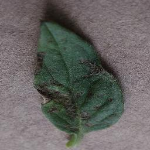

1/1 [==============================] - 0s 42ms/step
prediction:  1
prediction label:  plant
CORRECT



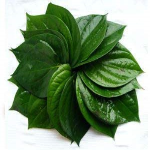

1/1 [==============================] - 0s 38ms/step
prediction:  1
prediction label:  plant
CORRECT



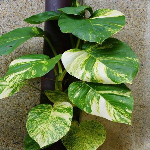

1/1 [==============================] - 0s 36ms/step
prediction:  1
prediction label:  plant
CORRECT



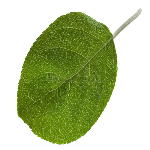

1/1 [==============================] - 0s 48ms/step
prediction:  1
prediction label:  plant
CORRECT



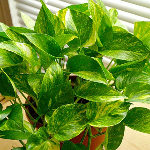

1/1 [==============================] - 0s 55ms/step
prediction:  1
prediction label:  plant
CORRECT



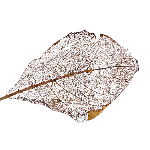

1/1 [==============================] - 0s 78ms/step
prediction:  0
prediction label:  non-plant
WRONG!



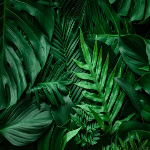

1/1 [==============================] - 0s 51ms/step
prediction:  1
prediction label:  plant
CORRECT



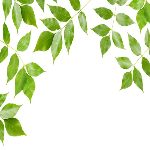

1/1 [==============================] - 0s 37ms/step
prediction:  0
prediction label:  non-plant
WRONG!



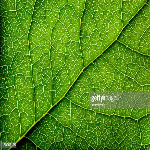

1/1 [==============================] - 0s 57ms/step
prediction:  1
prediction label:  plant
CORRECT



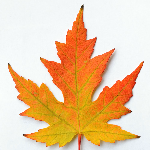

1/1 [==============================] - 0s 44ms/step
prediction:  0
prediction label:  non-plant
WRONG!



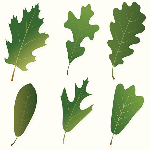

1/1 [==============================] - 0s 53ms/step
prediction:  1
prediction label:  plant
CORRECT



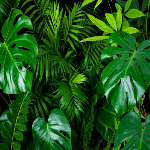

1/1 [==============================] - 0s 40ms/step
prediction:  1
prediction label:  plant
CORRECT



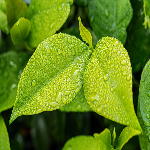

1/1 [==============================] - 0s 46ms/step
prediction:  1
prediction label:  plant
CORRECT



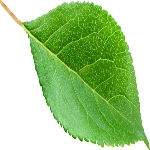

1/1 [==============================] - 0s 45ms/step
prediction:  1
prediction label:  plant
CORRECT



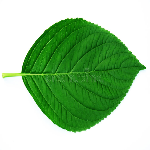

1/1 [==============================] - 0s 40ms/step
prediction:  1
prediction label:  plant
CORRECT



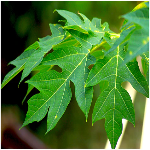

1/1 [==============================] - 0s 47ms/step
prediction:  1
prediction label:  plant
CORRECT



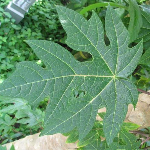

1/1 [==============================] - 0s 41ms/step
prediction:  1
prediction label:  plant
CORRECT



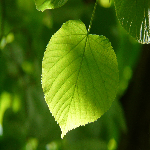

1/1 [==============================] - 0s 58ms/step
prediction:  1
prediction label:  plant
CORRECT



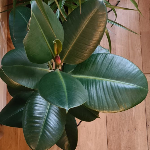

1/1 [==============================] - 0s 40ms/step
prediction:  0
prediction label:  non-plant
WRONG!



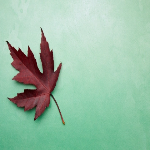

1/1 [==============================] - 0s 46ms/step
prediction:  0
prediction label:  non-plant
WRONG!



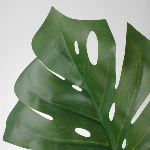

1/1 [==============================] - 0s 37ms/step
prediction:  1
prediction label:  plant
CORRECT



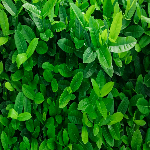

1/1 [==============================] - 0s 40ms/step
prediction:  1
prediction label:  plant
CORRECT



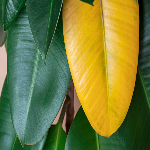

1/1 [==============================] - 0s 48ms/step
prediction:  1
prediction label:  plant
CORRECT



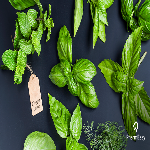

1/1 [==============================] - 0s 35ms/step
prediction:  1
prediction label:  plant
CORRECT



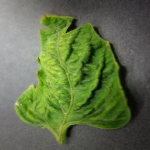

1/1 [==============================] - 0s 47ms/step
prediction:  1
prediction label:  plant
CORRECT



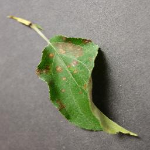

1/1 [==============================] - 0s 38ms/step
prediction:  1
prediction label:  plant
CORRECT



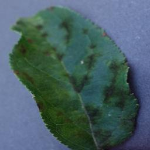

1/1 [==============================] - 0s 46ms/step
prediction:  1
prediction label:  plant
CORRECT



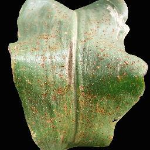

1/1 [==============================] - 0s 36ms/step
prediction:  0
prediction label:  non-plant
WRONG!



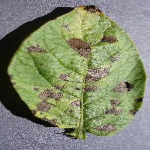

1/1 [==============================] - 0s 43ms/step
prediction:  1
prediction label:  plant
CORRECT



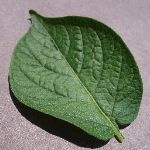

1/1 [==============================] - 0s 38ms/step
prediction:  1
prediction label:  plant
CORRECT



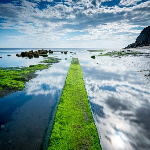

1/1 [==============================] - 0s 36ms/step
prediction:  0
prediction label:  non-plant
CORRECT



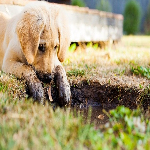

1/1 [==============================] - 0s 43ms/step
prediction:  0
prediction label:  non-plant
CORRECT



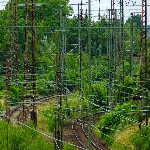

1/1 [==============================] - 0s 34ms/step
prediction:  1
prediction label:  plant
WRONG!



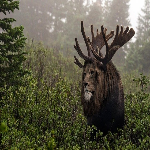

1/1 [==============================] - 0s 35ms/step
prediction:  0
prediction label:  non-plant
CORRECT



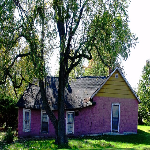

1/1 [==============================] - 0s 36ms/step
prediction:  0
prediction label:  non-plant
CORRECT



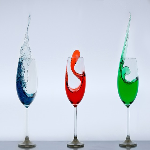

1/1 [==============================] - 0s 43ms/step
prediction:  0
prediction label:  non-plant
CORRECT



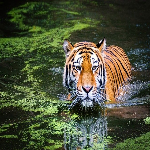

1/1 [==============================] - 0s 39ms/step
prediction:  0
prediction label:  non-plant
CORRECT



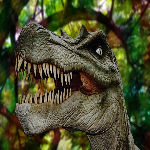

1/1 [==============================] - 0s 40ms/step
prediction:  0
prediction label:  non-plant
CORRECT



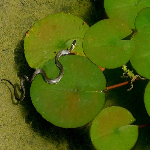

1/1 [==============================] - 0s 34ms/step
prediction:  1
prediction label:  plant
WRONG!



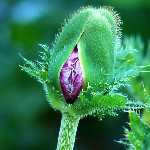

1/1 [==============================] - 0s 40ms/step
prediction:  1
prediction label:  plant
WRONG!



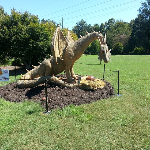

1/1 [==============================] - 0s 37ms/step
prediction:  0
prediction label:  non-plant
CORRECT



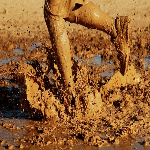

1/1 [==============================] - 0s 34ms/step
prediction:  0
prediction label:  non-plant
CORRECT



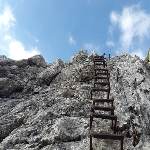

1/1 [==============================] - 0s 36ms/step
prediction:  0
prediction label:  non-plant
CORRECT



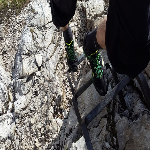

1/1 [==============================] - 0s 34ms/step
prediction:  0
prediction label:  non-plant
CORRECT



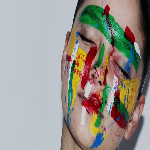

1/1 [==============================] - 0s 37ms/step
prediction:  0
prediction label:  non-plant
CORRECT



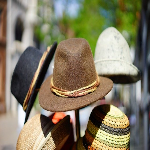

1/1 [==============================] - 0s 38ms/step
prediction:  0
prediction label:  non-plant
CORRECT



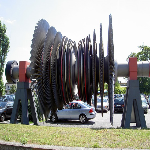

1/1 [==============================] - 0s 37ms/step
prediction:  0
prediction label:  non-plant
CORRECT



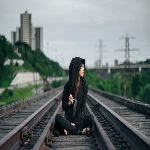

1/1 [==============================] - 0s 37ms/step
prediction:  0
prediction label:  non-plant
CORRECT



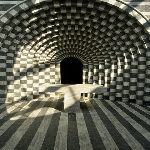

1/1 [==============================] - 0s 55ms/step
prediction:  0
prediction label:  non-plant
CORRECT



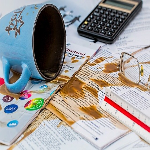

1/1 [==============================] - 0s 38ms/step
prediction:  1
prediction label:  plant
WRONG!



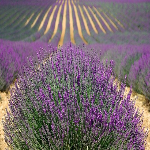

1/1 [==============================] - 0s 34ms/step
prediction:  0
prediction label:  non-plant
CORRECT



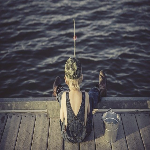

1/1 [==============================] - 0s 36ms/step
prediction:  0
prediction label:  non-plant
CORRECT



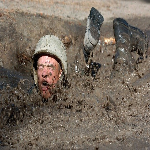

1/1 [==============================] - 0s 40ms/step
prediction:  0
prediction label:  non-plant
CORRECT



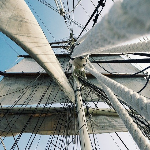

1/1 [==============================] - 0s 40ms/step
prediction:  0
prediction label:  non-plant
CORRECT



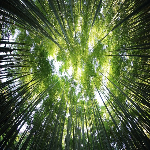

1/1 [==============================] - 0s 37ms/step
prediction:  1
prediction label:  plant
WRONG!



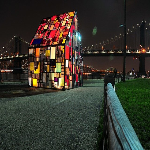

1/1 [==============================] - 0s 39ms/step
prediction:  0
prediction label:  non-plant
CORRECT



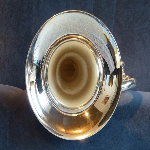

1/1 [==============================] - 0s 34ms/step
prediction:  0
prediction label:  non-plant
CORRECT



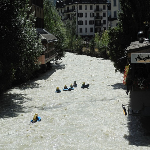

1/1 [==============================] - 0s 35ms/step
prediction:  0
prediction label:  non-plant
CORRECT



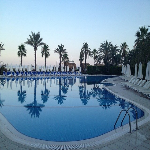

1/1 [==============================] - 0s 36ms/step
prediction:  0
prediction label:  non-plant
CORRECT



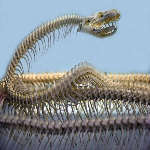

1/1 [==============================] - 0s 47ms/step
prediction:  0
prediction label:  non-plant
CORRECT



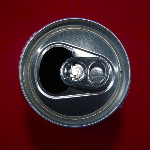

1/1 [==============================] - 0s 38ms/step
prediction:  0
prediction label:  non-plant
CORRECT



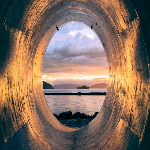

1/1 [==============================] - 0s 36ms/step
prediction:  0
prediction label:  non-plant
CORRECT



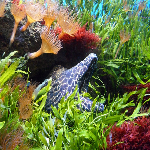

1/1 [==============================] - 0s 60ms/step
prediction:  0
prediction label:  non-plant
CORRECT



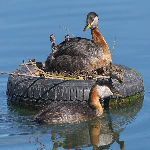

1/1 [==============================] - 0s 38ms/step
prediction:  0
prediction label:  non-plant
CORRECT



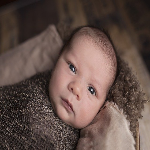

1/1 [==============================] - 0s 34ms/step
prediction:  0
prediction label:  non-plant
CORRECT



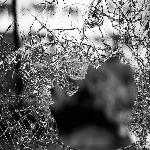

1/1 [==============================] - 0s 34ms/step
prediction:  0
prediction label:  non-plant
CORRECT



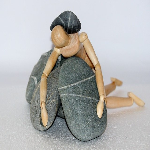

1/1 [==============================] - 0s 38ms/step
prediction:  1
prediction label:  plant
WRONG!



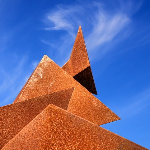

1/1 [==============================] - 0s 35ms/step
prediction:  0
prediction label:  non-plant
CORRECT



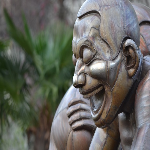

1/1 [==============================] - 0s 35ms/step
prediction:  0
prediction label:  non-plant
CORRECT



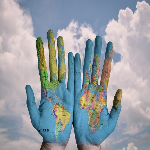

1/1 [==============================] - 0s 39ms/step
prediction:  0
prediction label:  non-plant
CORRECT



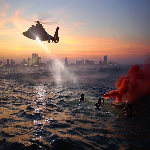

1/1 [==============================] - 0s 35ms/step
prediction:  0
prediction label:  non-plant
CORRECT



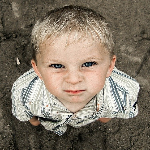

1/1 [==============================] - 0s 39ms/step
prediction:  0
prediction label:  non-plant
CORRECT



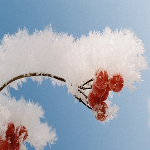

1/1 [==============================] - 0s 38ms/step
prediction:  0
prediction label:  non-plant
CORRECT



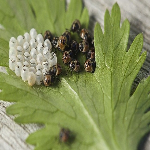

1/1 [==============================] - 0s 37ms/step
prediction:  1
prediction label:  plant
WRONG!



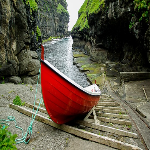

1/1 [==============================] - 0s 39ms/step
prediction:  0
prediction label:  non-plant
CORRECT



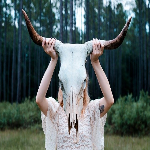

1/1 [==============================] - 0s 35ms/step
prediction:  0
prediction label:  non-plant
CORRECT



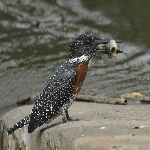

1/1 [==============================] - 0s 45ms/step
prediction:  0
prediction label:  non-plant
CORRECT



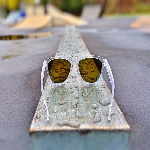

1/1 [==============================] - 0s 37ms/step
prediction:  0
prediction label:  non-plant
CORRECT



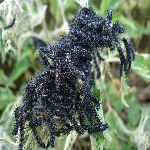

1/1 [==============================] - 0s 37ms/step
prediction:  0
prediction label:  non-plant
CORRECT



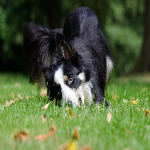

1/1 [==============================] - 0s 48ms/step
prediction:  0
prediction label:  non-plant
CORRECT



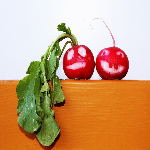

1/1 [==============================] - 0s 39ms/step
prediction:  0
prediction label:  non-plant
CORRECT



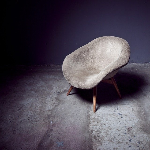

1/1 [==============================] - 0s 44ms/step
prediction:  0
prediction label:  non-plant
CORRECT



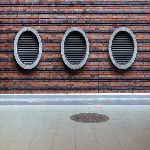

1/1 [==============================] - 0s 40ms/step
prediction:  0
prediction label:  non-plant
CORRECT



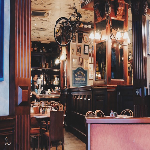

1/1 [==============================] - 0s 41ms/step
prediction:  0
prediction label:  non-plant
CORRECT



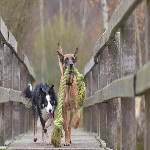

1/1 [==============================] - 0s 35ms/step
prediction:  0
prediction label:  non-plant
CORRECT



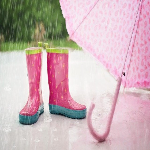

1/1 [==============================] - 0s 54ms/step
prediction:  0
prediction label:  non-plant
CORRECT



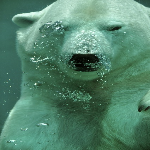

1/1 [==============================] - 0s 43ms/step
prediction:  0
prediction label:  non-plant
CORRECT



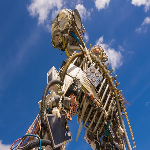

1/1 [==============================] - 0s 44ms/step
prediction:  1
prediction label:  plant
WRONG!



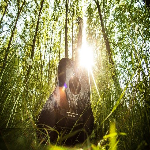

1/1 [==============================] - 0s 39ms/step
prediction:  0
prediction label:  non-plant
CORRECT



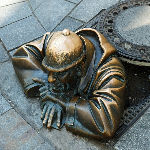

1/1 [==============================] - 0s 47ms/step
prediction:  0
prediction label:  non-plant
CORRECT



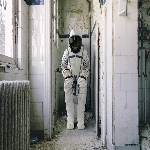

1/1 [==============================] - 0s 49ms/step
prediction:  0
prediction label:  non-plant
CORRECT



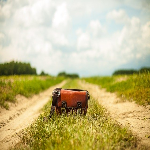

1/1 [==============================] - 0s 36ms/step
prediction:  0
prediction label:  non-plant
CORRECT



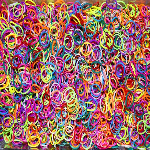

1/1 [==============================] - 0s 36ms/step
prediction:  0
prediction label:  non-plant
CORRECT



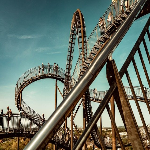

1/1 [==============================] - 0s 39ms/step
prediction:  0
prediction label:  non-plant
CORRECT



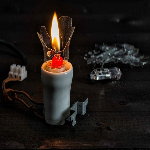

1/1 [==============================] - 0s 38ms/step
prediction:  0
prediction label:  non-plant
CORRECT



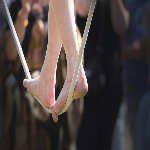

1/1 [==============================] - 0s 34ms/step
prediction:  0
prediction label:  non-plant
CORRECT



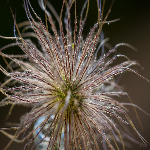

1/1 [==============================] - 0s 36ms/step
prediction:  0
prediction label:  non-plant
CORRECT



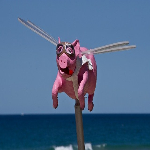

1/1 [==============================] - 0s 41ms/step
prediction:  0
prediction label:  non-plant
CORRECT



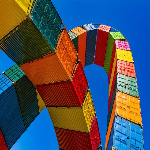

1/1 [==============================] - 0s 65ms/step
prediction:  0
prediction label:  non-plant
CORRECT



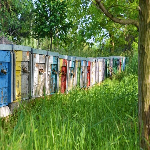

1/1 [==============================] - 0s 41ms/step
prediction:  1
prediction label:  plant
WRONG!



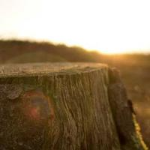

1/1 [==============================] - 0s 55ms/step
prediction:  0
prediction label:  non-plant
CORRECT



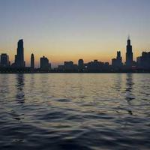

1/1 [==============================] - 0s 62ms/step
prediction:  0
prediction label:  non-plant
CORRECT



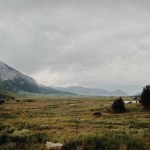

1/1 [==============================] - 0s 49ms/step
prediction:  0
prediction label:  non-plant
CORRECT



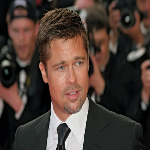

1/1 [==============================] - 0s 59ms/step
prediction:  0
prediction label:  non-plant
CORRECT



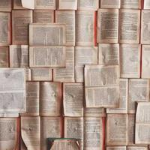

1/1 [==============================] - 0s 37ms/step
prediction:  0
prediction label:  non-plant
CORRECT



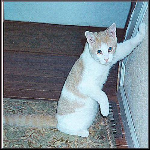

1/1 [==============================] - 0s 37ms/step
prediction:  0
prediction label:  non-plant
CORRECT



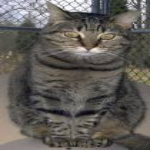

1/1 [==============================] - 0s 42ms/step
prediction:  0
prediction label:  non-plant
CORRECT



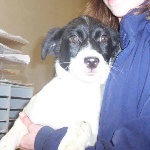

1/1 [==============================] - 0s 62ms/step
prediction:  1
prediction label:  plant
WRONG!



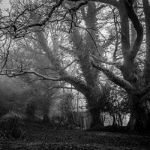

1/1 [==============================] - 0s 73ms/step
prediction:  0
prediction label:  non-plant
CORRECT



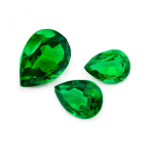

1/1 [==============================] - 0s 59ms/step
prediction:  1
prediction label:  plant
WRONG!



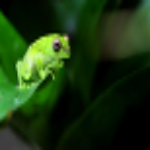

1/1 [==============================] - 0s 54ms/step
prediction:  1
prediction label:  plant
WRONG!



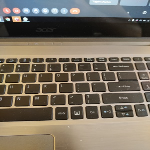

1/1 [==============================] - 0s 46ms/step
prediction:  0
prediction label:  non-plant
CORRECT



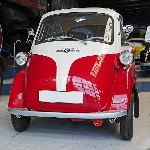

1/1 [==============================] - 0s 38ms/step
prediction:  0
prediction label:  non-plant
CORRECT



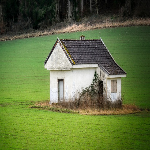

1/1 [==============================] - 0s 40ms/step
prediction:  0
prediction label:  non-plant
CORRECT



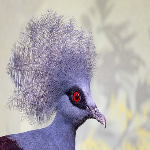

1/1 [==============================] - 0s 37ms/step
prediction:  0
prediction label:  non-plant
CORRECT



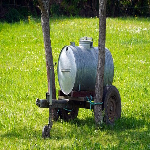

1/1 [==============================] - 0s 55ms/step
prediction:  0
prediction label:  non-plant
CORRECT



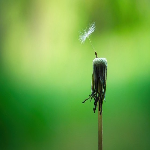

1/1 [==============================] - 0s 40ms/step
prediction:  1
prediction label:  plant
WRONG!



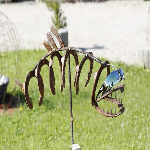

1/1 [==============================] - 0s 35ms/step
prediction:  0
prediction label:  non-plant
CORRECT



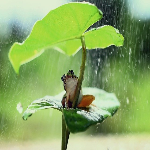

1/1 [==============================] - 0s 55ms/step
prediction:  1
prediction label:  plant
WRONG!


Correct predictions: 99 / 119
Incorrect predictions: 20 / 119
Accuracy % = 83.19


In [ ]:
print("-------NEURAL NETWORK MODEL-------:\n")
predict_func(model)

WITHOUT Confusing Images

-------NEURAL NETWORK MODEL-------:



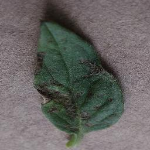

1/1 [==============================] - 0s 25ms/step
prediction:  1
prediction label:  plant
CORRECT



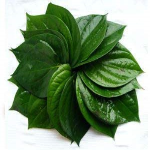

1/1 [==============================] - 0s 31ms/step
prediction:  1
prediction label:  plant
CORRECT



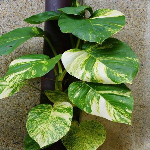

1/1 [==============================] - 0s 24ms/step
prediction:  1
prediction label:  plant
CORRECT



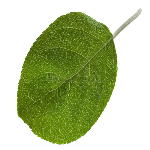

1/1 [==============================] - 0s 31ms/step
prediction:  1
prediction label:  plant
CORRECT



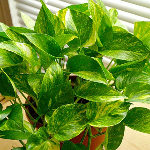

1/1 [==============================] - 0s 25ms/step
prediction:  1
prediction label:  plant
CORRECT



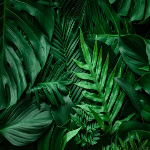

1/1 [==============================] - 0s 24ms/step
prediction:  1
prediction label:  plant
CORRECT



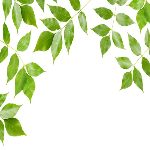

1/1 [==============================] - 0s 24ms/step
prediction:  0
prediction label:  non-plant
WRONG!



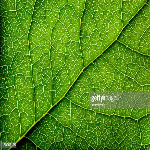

1/1 [==============================] - 0s 24ms/step
prediction:  1
prediction label:  plant
CORRECT



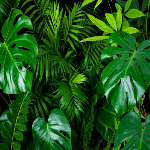

1/1 [==============================] - 0s 24ms/step
prediction:  1
prediction label:  plant
CORRECT



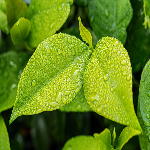

1/1 [==============================] - 0s 35ms/step
prediction:  1
prediction label:  plant
CORRECT



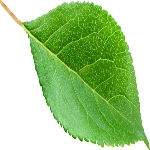

1/1 [==============================] - 0s 25ms/step
prediction:  1
prediction label:  plant
CORRECT



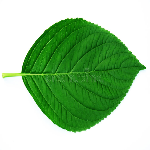

1/1 [==============================] - 0s 25ms/step
prediction:  1
prediction label:  plant
CORRECT



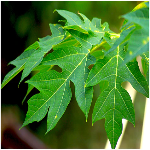

1/1 [==============================] - 0s 25ms/step
prediction:  1
prediction label:  plant
CORRECT



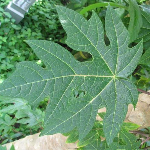

1/1 [==============================] - 0s 31ms/step
prediction:  1
prediction label:  plant
CORRECT



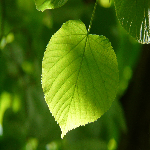

1/1 [==============================] - 0s 25ms/step
prediction:  1
prediction label:  plant
CORRECT



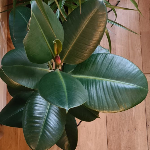

1/1 [==============================] - 0s 28ms/step
prediction:  0
prediction label:  non-plant
WRONG!



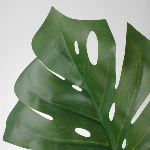

1/1 [==============================] - 0s 26ms/step
prediction:  1
prediction label:  plant
CORRECT



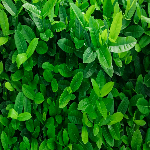

1/1 [==============================] - 0s 24ms/step
prediction:  1
prediction label:  plant
CORRECT



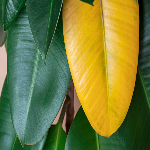

1/1 [==============================] - 0s 26ms/step
prediction:  1
prediction label:  plant
CORRECT



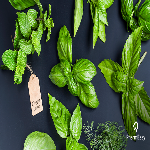

1/1 [==============================] - 0s 25ms/step
prediction:  1
prediction label:  plant
CORRECT



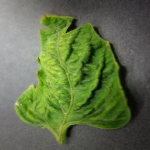

1/1 [==============================] - 0s 27ms/step
prediction:  1
prediction label:  plant
CORRECT



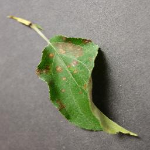

1/1 [==============================] - 0s 24ms/step
prediction:  1
prediction label:  plant
CORRECT



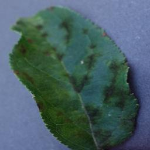

1/1 [==============================] - 0s 26ms/step
prediction:  1
prediction label:  plant
CORRECT



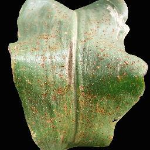

1/1 [==============================] - 0s 32ms/step
prediction:  0
prediction label:  non-plant
WRONG!



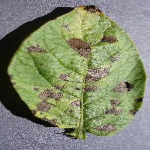

1/1 [==============================] - 0s 29ms/step
prediction:  1
prediction label:  plant
CORRECT



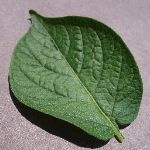

1/1 [==============================] - 0s 24ms/step
prediction:  1
prediction label:  plant
CORRECT



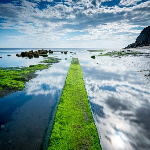

1/1 [==============================] - 0s 25ms/step
prediction:  0
prediction label:  non-plant
CORRECT



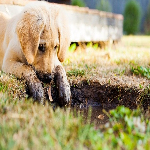

1/1 [==============================] - 0s 25ms/step
prediction:  0
prediction label:  non-plant
CORRECT



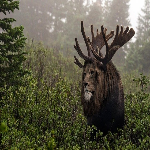

1/1 [==============================] - 0s 27ms/step
prediction:  0
prediction label:  non-plant
CORRECT



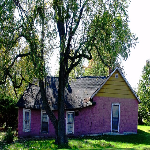

1/1 [==============================] - 0s 31ms/step
prediction:  0
prediction label:  non-plant
CORRECT



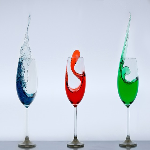

1/1 [==============================] - 0s 42ms/step
prediction:  0
prediction label:  non-plant
CORRECT



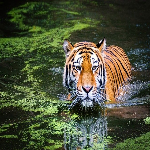

1/1 [==============================] - 0s 48ms/step
prediction:  0
prediction label:  non-plant
CORRECT



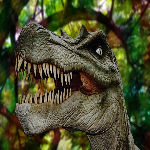

1/1 [==============================] - 0s 42ms/step
prediction:  0
prediction label:  non-plant
CORRECT



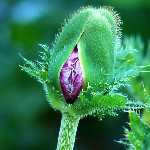

1/1 [==============================] - 0s 72ms/step
prediction:  1
prediction label:  plant
WRONG!



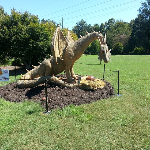

1/1 [==============================] - 0s 76ms/step
prediction:  0
prediction label:  non-plant
CORRECT



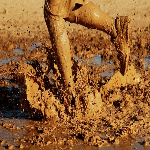

1/1 [==============================] - 0s 47ms/step
prediction:  0
prediction label:  non-plant
CORRECT



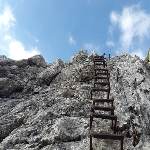

1/1 [==============================] - 0s 58ms/step
prediction:  0
prediction label:  non-plant
CORRECT



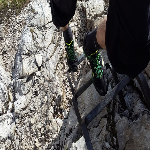

1/1 [==============================] - 0s 56ms/step
prediction:  0
prediction label:  non-plant
CORRECT



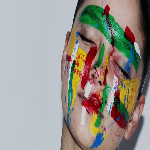

1/1 [==============================] - 0s 46ms/step
prediction:  0
prediction label:  non-plant
CORRECT



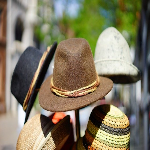

1/1 [==============================] - 0s 35ms/step
prediction:  0
prediction label:  non-plant
CORRECT



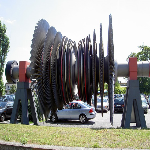

1/1 [==============================] - 0s 51ms/step
prediction:  0
prediction label:  non-plant
CORRECT



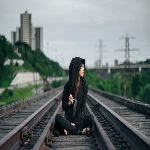

1/1 [==============================] - 0s 44ms/step
prediction:  0
prediction label:  non-plant
CORRECT



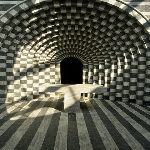

1/1 [==============================] - 0s 41ms/step
prediction:  0
prediction label:  non-plant
CORRECT



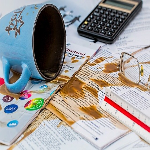

1/1 [==============================] - 0s 40ms/step
prediction:  1
prediction label:  plant
WRONG!



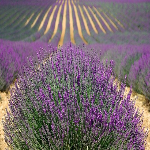

1/1 [==============================] - 0s 109ms/step
prediction:  0
prediction label:  non-plant
CORRECT



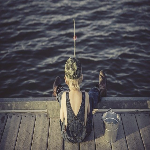

1/1 [==============================] - 0s 97ms/step
prediction:  0
prediction label:  non-plant
CORRECT



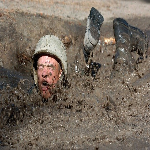

1/1 [==============================] - 0s 35ms/step
prediction:  0
prediction label:  non-plant
CORRECT



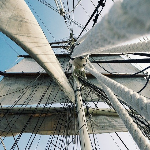

1/1 [==============================] - 0s 67ms/step
prediction:  0
prediction label:  non-plant
CORRECT



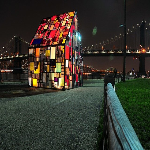

1/1 [==============================] - 0s 41ms/step
prediction:  0
prediction label:  non-plant
CORRECT



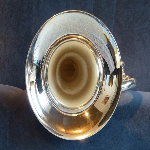

1/1 [==============================] - 0s 53ms/step
prediction:  0
prediction label:  non-plant
CORRECT



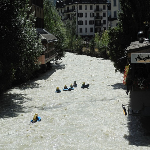

1/1 [==============================] - 0s 42ms/step
prediction:  0
prediction label:  non-plant
CORRECT



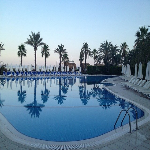

1/1 [==============================] - 0s 39ms/step
prediction:  0
prediction label:  non-plant
CORRECT



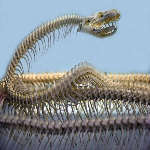

1/1 [==============================] - 0s 66ms/step
prediction:  0
prediction label:  non-plant
CORRECT



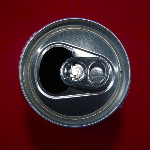

1/1 [==============================] - 0s 49ms/step
prediction:  0
prediction label:  non-plant
CORRECT



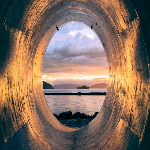

1/1 [==============================] - 0s 49ms/step
prediction:  0
prediction label:  non-plant
CORRECT



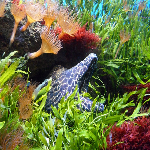

1/1 [==============================] - 0s 36ms/step
prediction:  0
prediction label:  non-plant
CORRECT



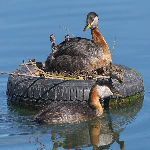

1/1 [==============================] - 0s 40ms/step
prediction:  0
prediction label:  non-plant
CORRECT



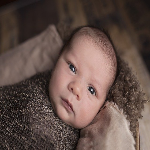

1/1 [==============================] - 0s 35ms/step
prediction:  0
prediction label:  non-plant
CORRECT



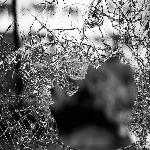

1/1 [==============================] - 0s 35ms/step
prediction:  0
prediction label:  non-plant
CORRECT



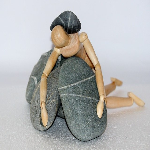

1/1 [==============================] - 0s 34ms/step
prediction:  1
prediction label:  plant
WRONG!



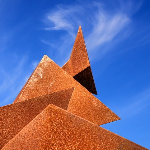

1/1 [==============================] - 0s 34ms/step
prediction:  0
prediction label:  non-plant
CORRECT



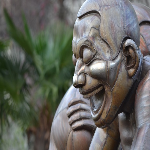

1/1 [==============================] - 0s 53ms/step
prediction:  0
prediction label:  non-plant
CORRECT



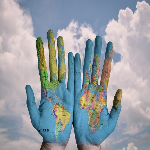

1/1 [==============================] - 0s 112ms/step
prediction:  0
prediction label:  non-plant
CORRECT



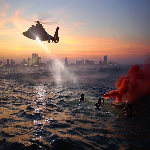

1/1 [==============================] - 0s 119ms/step
prediction:  0
prediction label:  non-plant
CORRECT



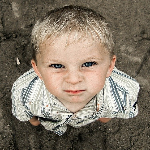

1/1 [==============================] - 0s 81ms/step
prediction:  0
prediction label:  non-plant
CORRECT



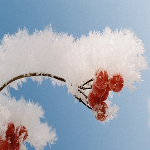

1/1 [==============================] - 0s 56ms/step
prediction:  0
prediction label:  non-plant
CORRECT



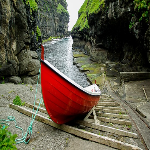

1/1 [==============================] - 0s 38ms/step
prediction:  0
prediction label:  non-plant
CORRECT



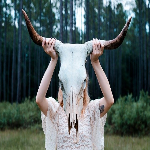

1/1 [==============================] - 0s 101ms/step
prediction:  0
prediction label:  non-plant
CORRECT



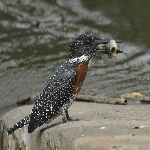

1/1 [==============================] - 0s 83ms/step
prediction:  0
prediction label:  non-plant
CORRECT



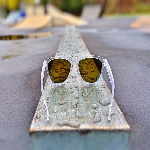

1/1 [==============================] - 0s 82ms/step
prediction:  0
prediction label:  non-plant
CORRECT



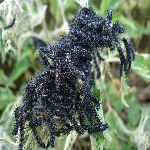

1/1 [==============================] - 0s 90ms/step
prediction:  0
prediction label:  non-plant
CORRECT



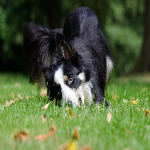

1/1 [==============================] - 0s 105ms/step
prediction:  0
prediction label:  non-plant
CORRECT



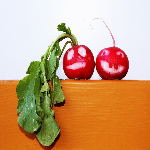

1/1 [==============================] - 0s 68ms/step
prediction:  0
prediction label:  non-plant
CORRECT



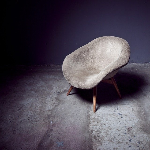

1/1 [==============================] - 0s 40ms/step
prediction:  0
prediction label:  non-plant
CORRECT



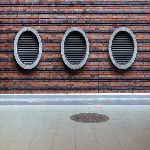

1/1 [==============================] - 0s 100ms/step
prediction:  0
prediction label:  non-plant
CORRECT



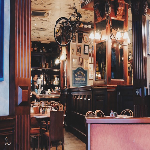

1/1 [==============================] - 0s 70ms/step
prediction:  0
prediction label:  non-plant
CORRECT



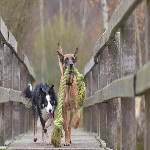

1/1 [==============================] - 0s 36ms/step
prediction:  0
prediction label:  non-plant
CORRECT



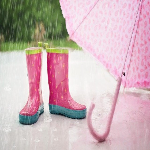

1/1 [==============================] - 0s 41ms/step
prediction:  0
prediction label:  non-plant
CORRECT



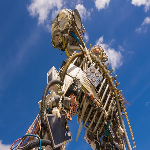

1/1 [==============================] - 0s 87ms/step
prediction:  1
prediction label:  plant
WRONG!



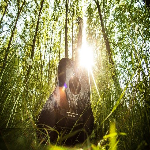

1/1 [==============================] - 0s 58ms/step
prediction:  0
prediction label:  non-plant
CORRECT



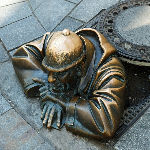

1/1 [==============================] - 0s 86ms/step
prediction:  0
prediction label:  non-plant
CORRECT



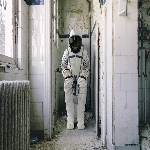

1/1 [==============================] - 0s 83ms/step
prediction:  0
prediction label:  non-plant
CORRECT



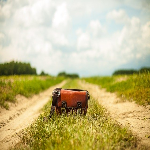

1/1 [==============================] - 0s 96ms/step
prediction:  0
prediction label:  non-plant
CORRECT



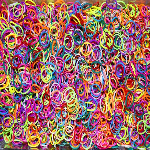

1/1 [==============================] - 0s 83ms/step
prediction:  0
prediction label:  non-plant
CORRECT



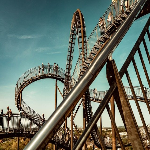

1/1 [==============================] - 0s 103ms/step
prediction:  0
prediction label:  non-plant
CORRECT



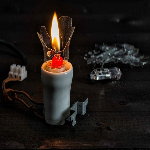

1/1 [==============================] - 0s 60ms/step
prediction:  0
prediction label:  non-plant
CORRECT



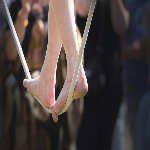

1/1 [==============================] - 0s 40ms/step
prediction:  0
prediction label:  non-plant
CORRECT



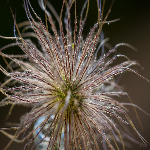

1/1 [==============================] - 0s 46ms/step
prediction:  0
prediction label:  non-plant
CORRECT



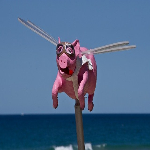

1/1 [==============================] - 0s 89ms/step
prediction:  0
prediction label:  non-plant
CORRECT



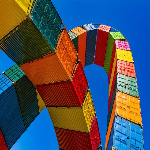

1/1 [==============================] - 0s 37ms/step
prediction:  0
prediction label:  non-plant
CORRECT



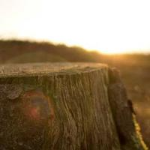

1/1 [==============================] - 0s 37ms/step
prediction:  0
prediction label:  non-plant
CORRECT



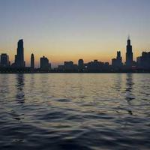

1/1 [==============================] - 0s 44ms/step
prediction:  0
prediction label:  non-plant
CORRECT



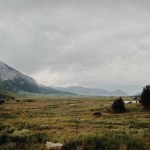

1/1 [==============================] - 0s 36ms/step
prediction:  0
prediction label:  non-plant
CORRECT



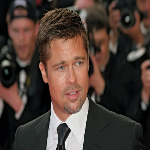

1/1 [==============================] - 0s 36ms/step
prediction:  0
prediction label:  non-plant
CORRECT



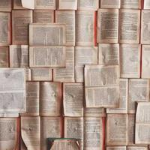

1/1 [==============================] - 0s 36ms/step
prediction:  0
prediction label:  non-plant
CORRECT



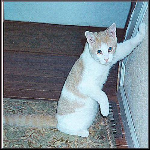

1/1 [==============================] - 0s 39ms/step
prediction:  0
prediction label:  non-plant
CORRECT



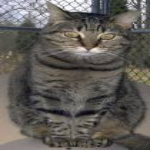

1/1 [==============================] - 0s 55ms/step
prediction:  0
prediction label:  non-plant
CORRECT



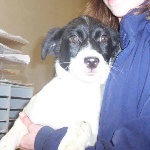

1/1 [==============================] - 0s 41ms/step
prediction:  1
prediction label:  plant
WRONG!



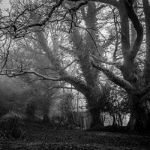

1/1 [==============================] - 0s 38ms/step
prediction:  0
prediction label:  non-plant
CORRECT



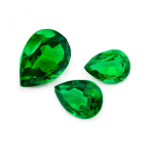

1/1 [==============================] - 0s 39ms/step
prediction:  1
prediction label:  plant
WRONG!



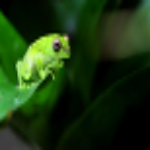

1/1 [==============================] - 0s 36ms/step
prediction:  1
prediction label:  plant
WRONG!



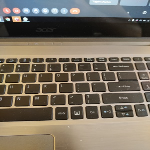

1/1 [==============================] - 0s 36ms/step
prediction:  0
prediction label:  non-plant
CORRECT



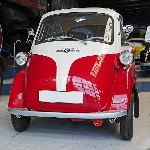

1/1 [==============================] - 0s 35ms/step
prediction:  0
prediction label:  non-plant
CORRECT



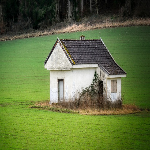

1/1 [==============================] - 0s 68ms/step
prediction:  0
prediction label:  non-plant
CORRECT



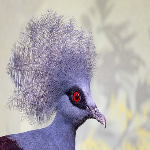

1/1 [==============================] - 0s 39ms/step
prediction:  0
prediction label:  non-plant
CORRECT



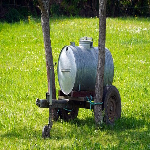

1/1 [==============================] - 0s 52ms/step
prediction:  0
prediction label:  non-plant
CORRECT



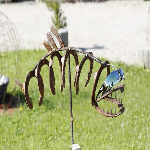

1/1 [==============================] - 0s 36ms/step
prediction:  0
prediction label:  non-plant
CORRECT


Correct predictions: 97 / 107
Incorrect predictions: 10 / 107
Accuracy % = 90.65


In [ ]:
print("-------NEURAL NETWORK MODEL-------:\n")
predict_func(model)